In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from scipy.spatial.distance import cdist
import seaborn as sns
from io import StringIO

folder = './Data/'

# Load all three CSV files
df_width = pd.read_csv(os.path.join(folder, 'widthConstant.csv'), header=None)
df_length = pd.read_csv(os.path.join(folder, 'lengthConstant.csv'), header=None)
df_intensity = pd.read_csv(os.path.join(folder, 'intensityConstant.csv'), header=None)



In [2]:
# Print the shapes to verify
print(f"DataFrame shapes: Width {df_width.shape}, Length {df_length.shape}, Intensity {df_intensity.shape}")

# Separate metadata from measurements
metadata = df_width.iloc[:, :3].copy()
metadata.columns = ['y_coordinate', 'z_coordinate', 'power']
width_data = df_width.iloc[:, 3:-4].copy()
length_data = df_length.iloc[:, 3:-4].copy()
intensity_data = df_intensity.iloc[:, 3:-4].copy()



DataFrame shapes: Width (488, 112), Length (488, 112), Intensity (488, 112)


In [3]:
# Remove rows with maximum y coordinate
y_values = metadata['y_coordinate'].values
width_data = width_data[metadata['y_coordinate'] != y_values.max()]
length_data = length_data[metadata['y_coordinate'] != y_values.max()]
intensity_data = intensity_data[metadata['y_coordinate'] != y_values.max()]
metadata = metadata[metadata['y_coordinate'] != y_values.max()]



In [4]:
# Standardize each feature set
scaler_width = StandardScaler()
scaler_length = StandardScaler()
scaler_intensity = StandardScaler()

scaled_width = scaler_width.fit_transform(width_data)
scaled_length = scaler_length.fit_transform(length_data)
scaled_intensity = scaler_intensity.fit_transform(intensity_data)



In [5]:
# Combine the scaled features for clustering
combined_features = np.hstack((scaled_width, scaled_length, scaled_intensity))
print(f"Combined features shape: {combined_features.shape}")



Combined features shape: (478, 315)


In [6]:
MAX_NUM_CLUSTERS = 12

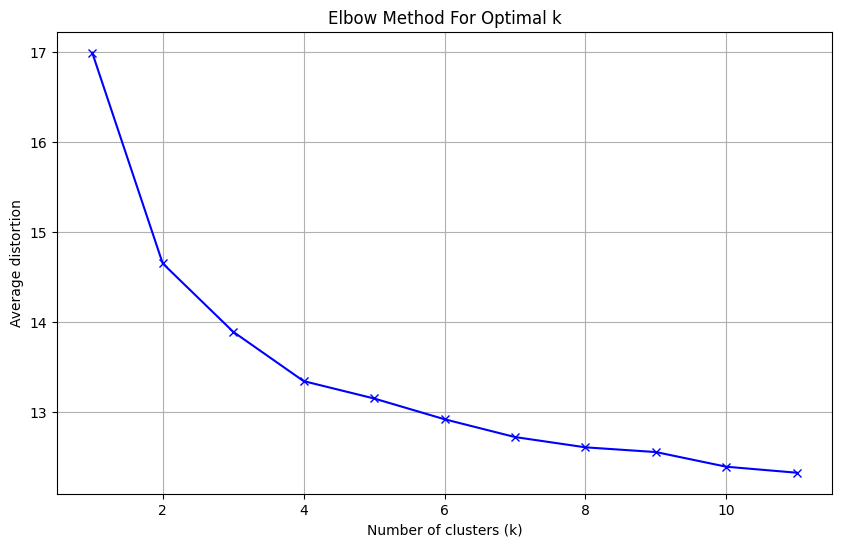

In [7]:
# Determine optimal number of clusters using the elbow method
distortions = []
K_range = range(1, MAX_NUM_CLUSTERS)
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(combined_features)
    distortions.append(sum(np.min(cdist(combined_features, kmeans.cluster_centers_, 'euclidean'), axis=1)) / combined_features.shape[0])

# Plot the elbow curve
plt.figure(figsize=(10, 6))
plt.plot(K_range, distortions, 'bx-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Average distortion')
plt.title('Elbow Method For Optimal k')
plt.grid(True)
plt.show()



For n_clusters = 2, the silhouette score is 0.236
For n_clusters = 3, the silhouette score is 0.138
For n_clusters = 4, the silhouette score is 0.147
For n_clusters = 5, the silhouette score is 0.128
For n_clusters = 6, the silhouette score is 0.081
For n_clusters = 7, the silhouette score is 0.077
For n_clusters = 8, the silhouette score is 0.078
For n_clusters = 9, the silhouette score is 0.064


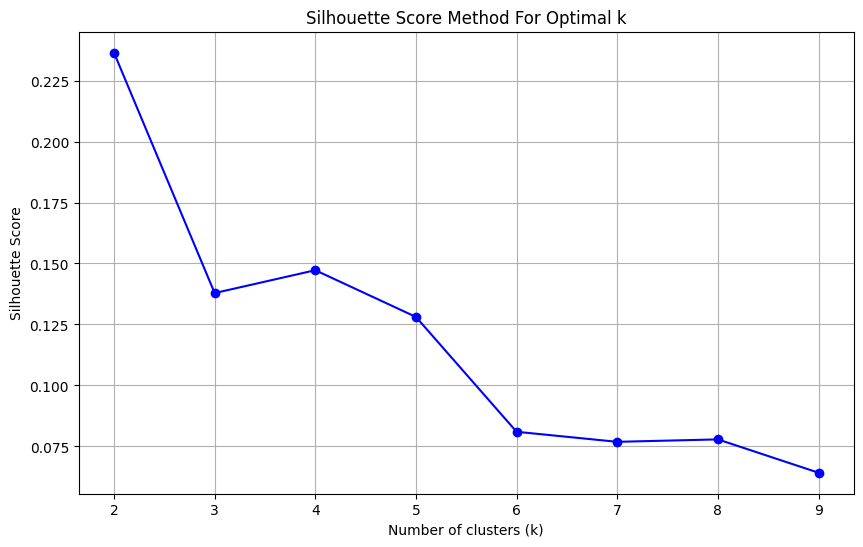

In [8]:
# Calculate silhouette scores for different numbers of clusters
silhouette_scores = []
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    cluster_labels = kmeans.fit_predict(combined_features)
    silhouette_avg = silhouette_score(combined_features, cluster_labels)
    silhouette_scores.append(silhouette_avg)
    print(f"For n_clusters = {k}, the silhouette score is {silhouette_avg:.3f}")

# Plot silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range(2, 10), silhouette_scores, 'bo-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score Method For Optimal k')
plt.grid(True)
plt.show()



In [9]:
optimal_k = 4  

# Apply K-means 
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
cluster_labels = kmeans.fit_predict(combined_features)



In [10]:
# Add cluster labels to the metadata
metadata['cluster'] = cluster_labels

# Calculate statistical descriptors for all features
stats = pd.DataFrame()
stats['y'] = metadata['y_coordinate']
stats['z'] = metadata['z_coordinate']
stats['power'] = metadata['power']
stats['cluster'] = metadata['cluster']

# Calculate statistics for width data
stats['mean_width'] = width_data.mean(axis=1)
stats['median_width'] = width_data.median(axis=1)
stats['std_width'] = width_data.std(axis=1)
stats['p5_width'] = width_data.quantile(0.05, axis=1)
stats['p95_width'] = width_data.quantile(0.95, axis=1)
stats['range_width'] = width_data.max(axis=1) - width_data.min(axis=1)

# Calculate statistics for length data
stats['mean_length'] = length_data.mean(axis=1)
stats['median_length'] = length_data.median(axis=1)
stats['std_length'] = length_data.std(axis=1)
stats['p5_length'] = length_data.quantile(0.05, axis=1)
stats['p95_length'] = length_data.quantile(0.95, axis=1)
stats['range_length'] = length_data.max(axis=1) - length_data.min(axis=1)

# Calculate statistics for intensity data
stats['mean_intensity'] = intensity_data.mean(axis=1)
stats['median_intensity'] = intensity_data.median(axis=1)
stats['std_intensity'] = intensity_data.std(axis=1)
stats['p5_intensity'] = intensity_data.quantile(0.05, axis=1)
stats['p95_intensity'] = intensity_data.quantile(0.95, axis=1)
stats['range_intensity'] = intensity_data.max(axis=1) - intensity_data.min(axis=1)

# Print statistics by cluster
print("\nStatistical descriptors by cluster:")
cluster_stats = stats.groupby('cluster').mean()
print(cluster_stats)




Statistical descriptors by cluster:
                y         z  power  mean_width  median_width  std_width  \
cluster                                                                   
0        2.216204  0.726389  180.0   23.469489     22.870370   3.868967   
1        1.719388  0.359864  180.0   18.545967     18.292517   2.315001   
2        1.858276  0.767586  180.0   20.228834     19.855172   2.864317   
3        1.675000  0.558974  180.0   22.170574     21.666667   3.598026   

          p5_width  p95_width  range_width  mean_length  ...  std_length  \
cluster                                                  ...               
0        18.877778  30.338889    22.555556    25.601852  ...    4.903317   
1        15.934694  22.282993    15.972789    20.544606  ...    2.922504   
2        16.900690  25.344828    17.827586    22.472447  ...    3.866209   
3        18.189744  28.410256    23.653846    23.753114  ...    4.463117   

         p5_length  p95_length  range_length  mean_inte

In [11]:
# Count samples in each cluster
cluster_counts = stats['cluster'].value_counts().sort_index()
print("\nNumber of samples in each cluster:")
print(cluster_counts)




Number of samples in each cluster:
cluster
0    108
1    147
2    145
3     78
Name: count, dtype: int64


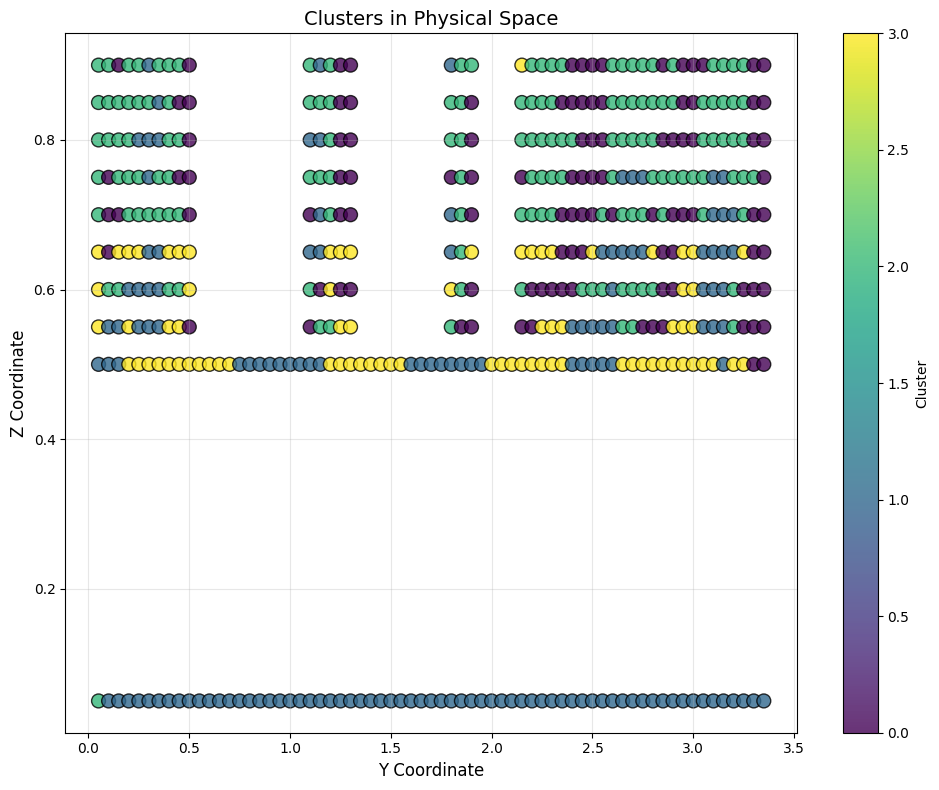

In [12]:
# Visualize the clusters in the physical space (y, z coordinates)
plt.figure(figsize=(10, 8))
scatter = plt.scatter(stats['y'], stats['z'], c=stats['cluster'], cmap='viridis',
                     s=100, alpha=0.8, edgecolors='k')
plt.xlabel('Y Coordinate', fontsize=12)
plt.ylabel('Z Coordinate', fontsize=12)
plt.title('Clusters in Physical Space', fontsize=14)
plt.colorbar(scatter, label='Cluster')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()



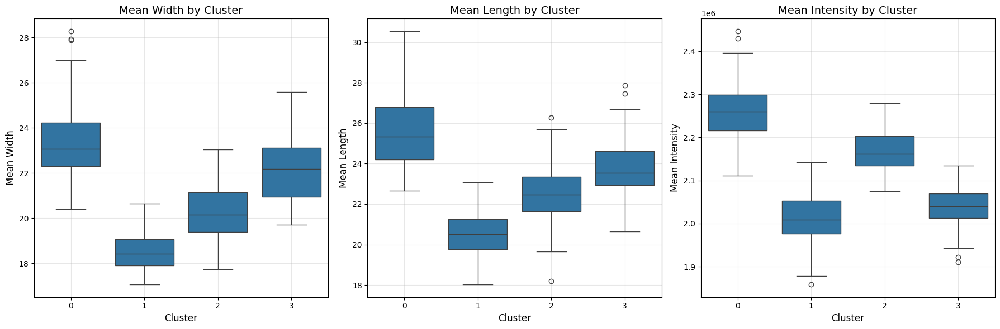

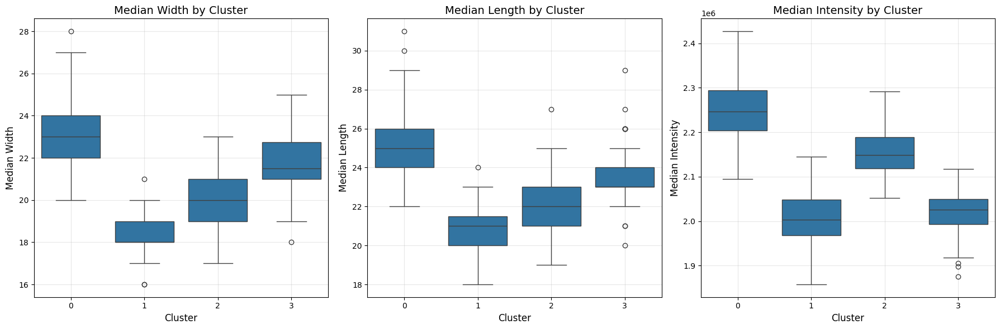

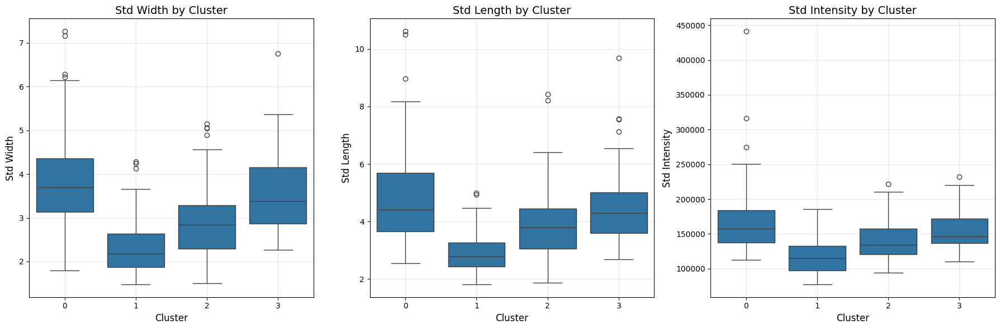

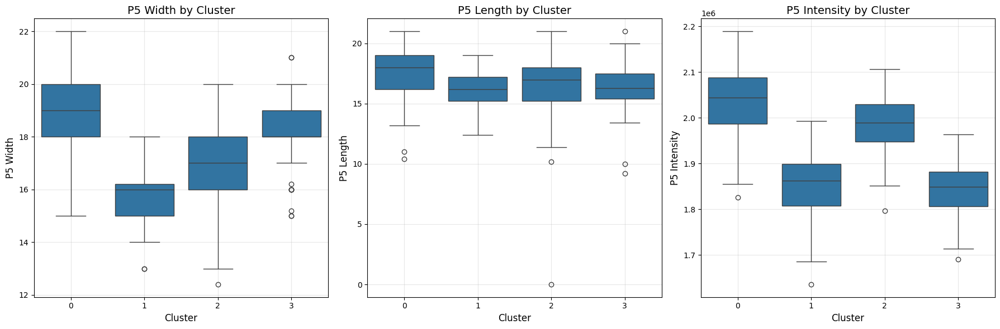

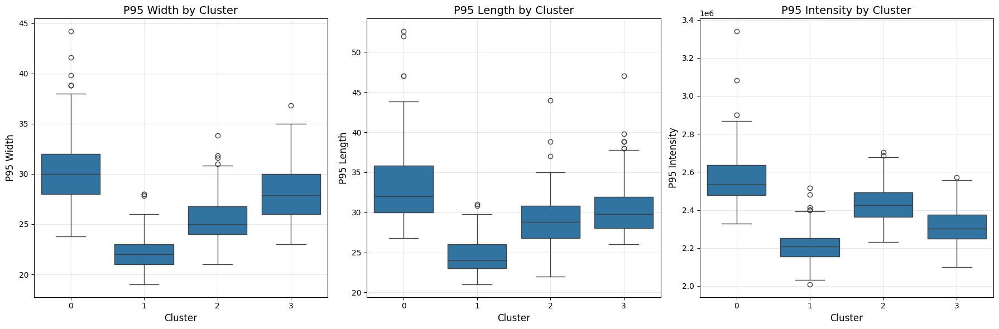

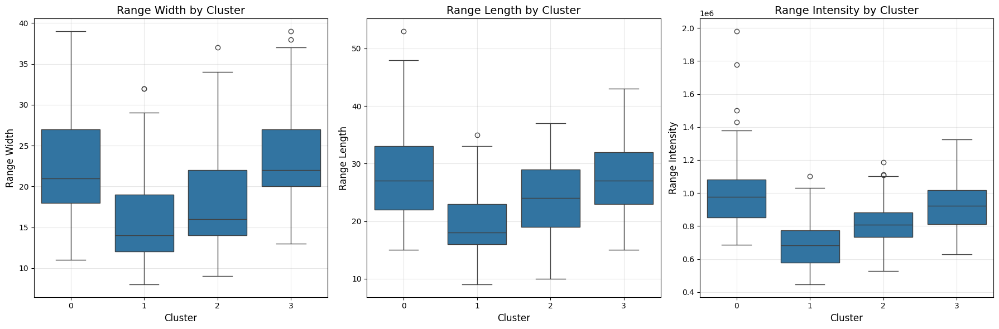

In [13]:
# Visualize statistical descriptors for each cluster
# Group metrics by feature type
feature_types = ['width', 'length', 'intensity']
metrics = ['mean', 'median', 'std', 'p5', 'p95', 'range']

for metric in metrics:
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    for i, feature in enumerate(feature_types):
        column_name = f"{metric}_{feature}"
        sns.boxplot(x='cluster', y=column_name, data=stats, ax=axes[i])
        axes[i].set_title(f'{metric.title()} {feature.title()} by Cluster', fontsize=14)
        axes[i].set_xlabel('Cluster', fontsize=12)
        axes[i].set_ylabel(f'{metric.title()} {feature.title()}', fontsize=12)
        axes[i].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()



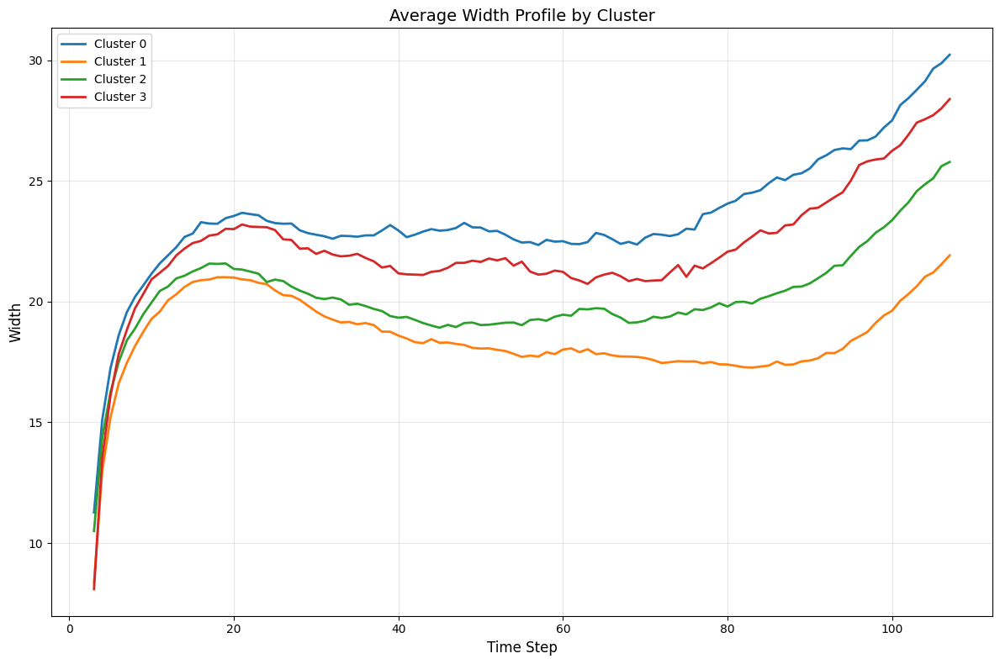

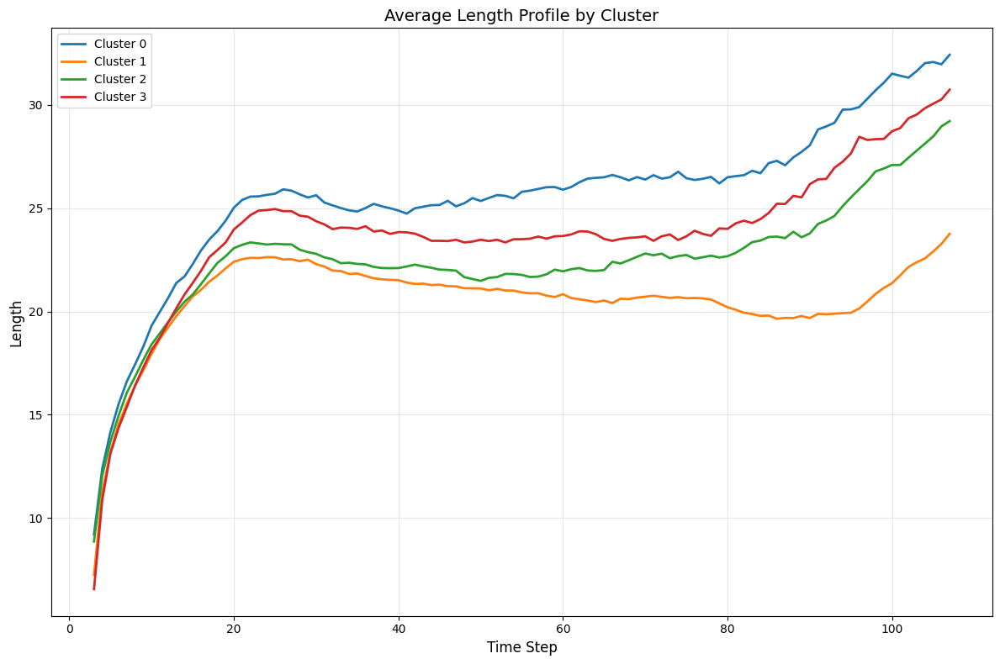

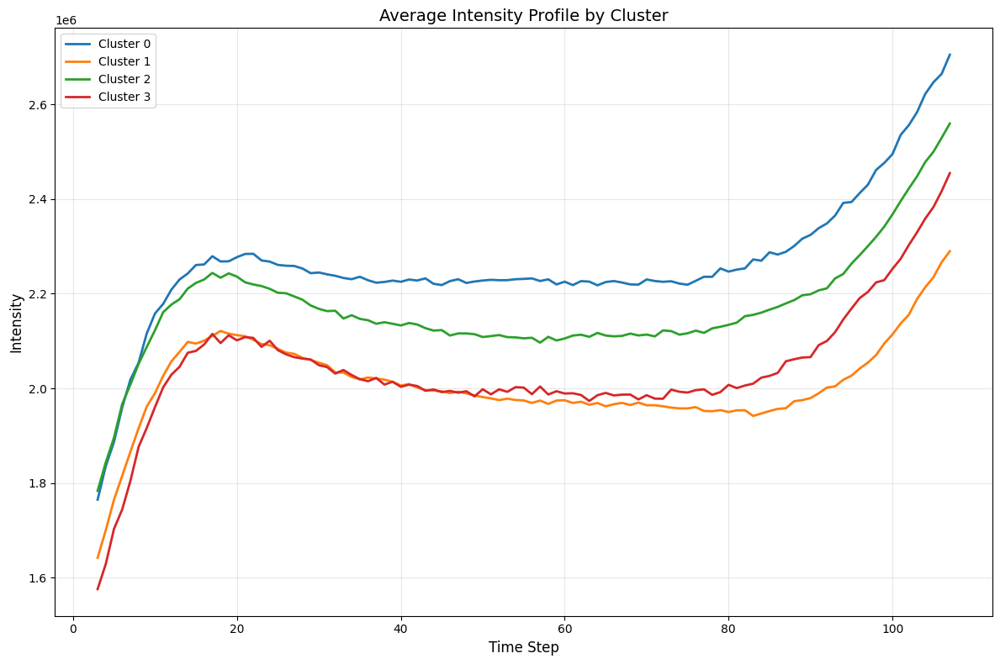

In [14]:
# Extract feature dimensions
width_dim = width_data.shape[1]
length_dim = length_data.shape[1]
intensity_dim = intensity_data.shape[1]

# Split centroids by feature
centroids = kmeans.cluster_centers_
width_centroids = centroids[:, :width_dim]
length_centroids = centroids[:, width_dim:width_dim+length_dim]
intensity_centroids = centroids[:, width_dim+length_dim:]

# Transform centroids back to original scale
width_centroids_orig = scaler_width.inverse_transform(width_centroids)
length_centroids_orig = scaler_length.inverse_transform(length_centroids)
intensity_centroids_orig = scaler_intensity.inverse_transform(intensity_centroids)

# Plot average profiles for each feature type
for feature_name, feature_data in [
    ('Width', width_data),
    ('Length', length_data),
    ('Intensity', intensity_data)
]:
    plt.figure(figsize=(12, 8))
    for cluster_id in range(optimal_k):
        # Get indices of samples in this cluster
        cluster_indices = np.where(cluster_labels == cluster_id)[0]
        # Calculate the mean profile for this cluster
        cluster_data = feature_data.iloc[cluster_indices]
        cluster_mean_profile = cluster_data.mean(axis=0)
        # Plot the mean profile
        plt.plot(cluster_mean_profile, label=f'Cluster {cluster_id}', linewidth=2)

    plt.xlabel('Time Step', fontsize=12)
    plt.ylabel(feature_name, fontsize=12)
    plt.title(f'Average {feature_name} Profile by Cluster', fontsize=14)
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()



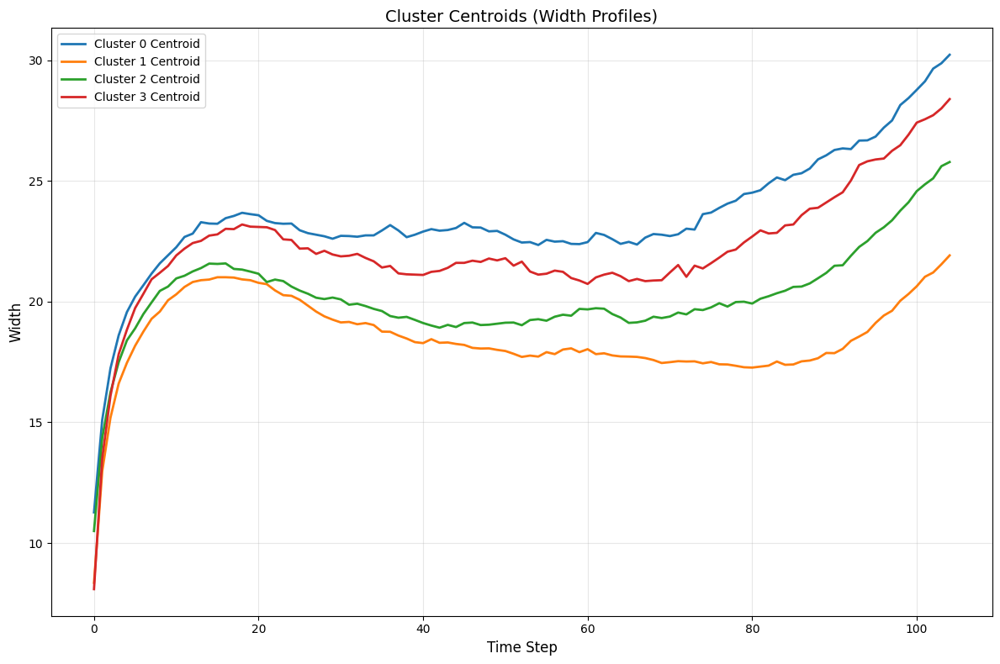

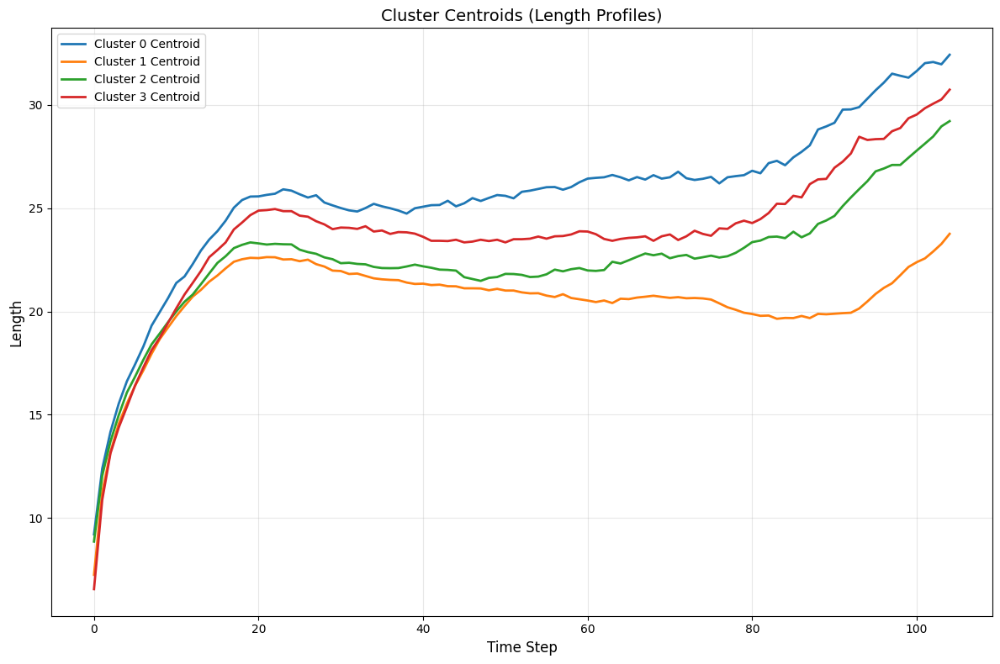

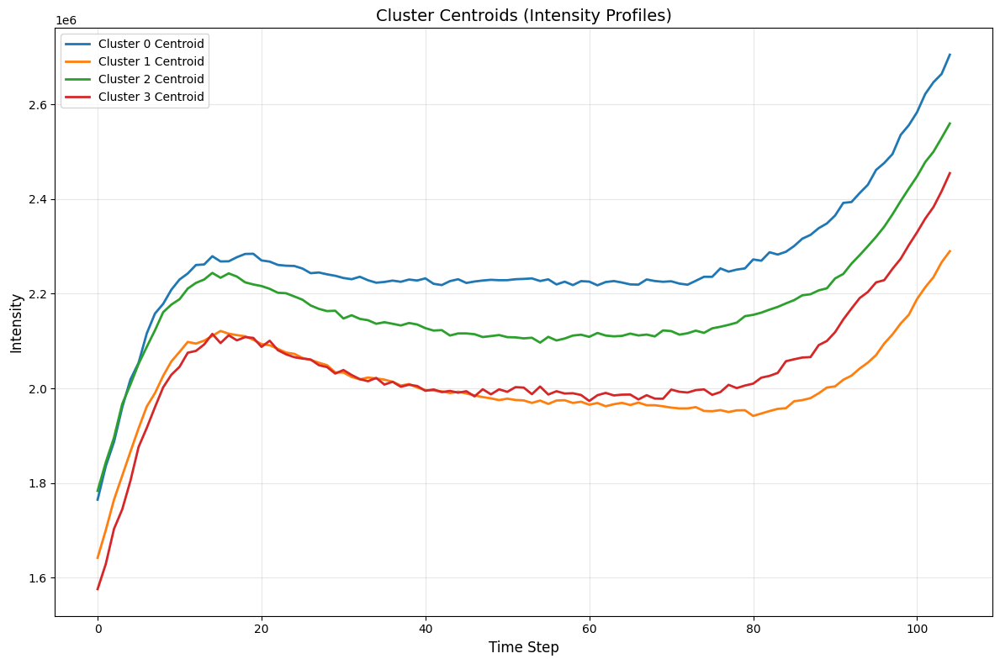

In [15]:
# Plot the actual centroids for each feature
for feature_name, centroids_orig in [
    ('Width', width_centroids_orig),
    ('Length', length_centroids_orig),
    ('Intensity', intensity_centroids_orig)
]:
    plt.figure(figsize=(12, 8))
    for cluster_id in range(optimal_k):
        plt.plot(centroids_orig[cluster_id], label=f'Cluster {cluster_id} Centroid', linewidth=2)

    plt.xlabel('Time Step', fontsize=12)
    plt.ylabel(feature_name, fontsize=12)
    plt.title(f'Cluster Centroids ({feature_name} Profiles)', fontsize=14)
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()



In [20]:
centroids_orig[cluster_id].shape, cluster_data.iloc[i, :].shape

((105,), (105,))

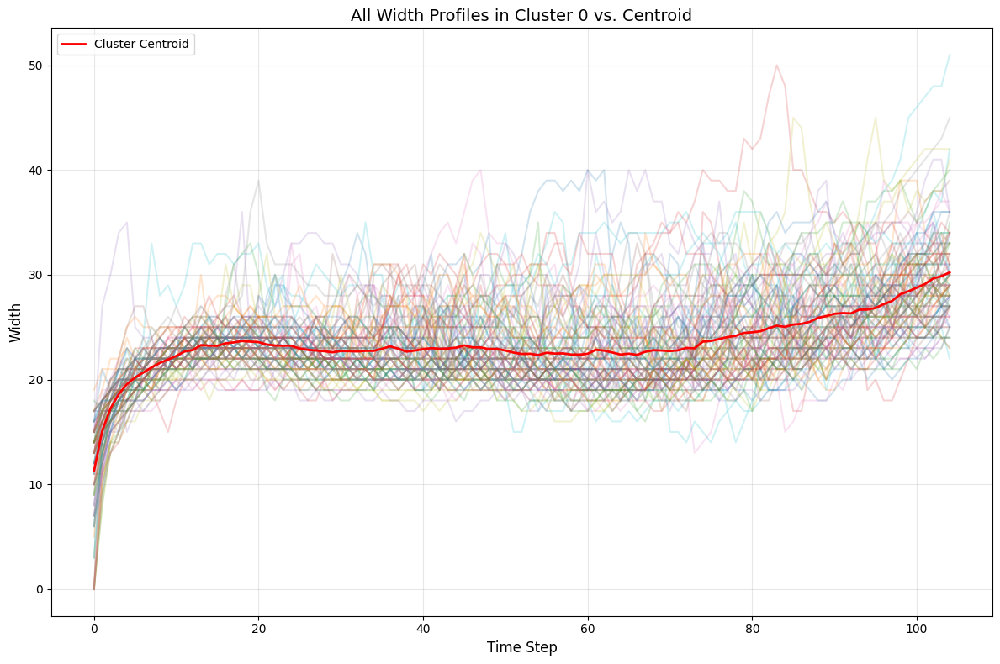

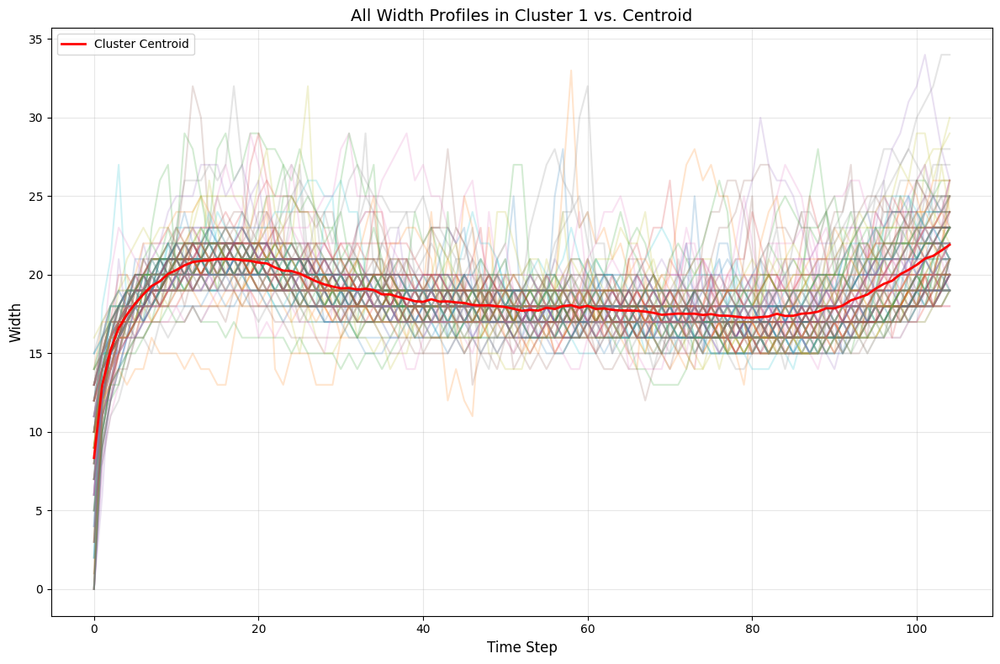

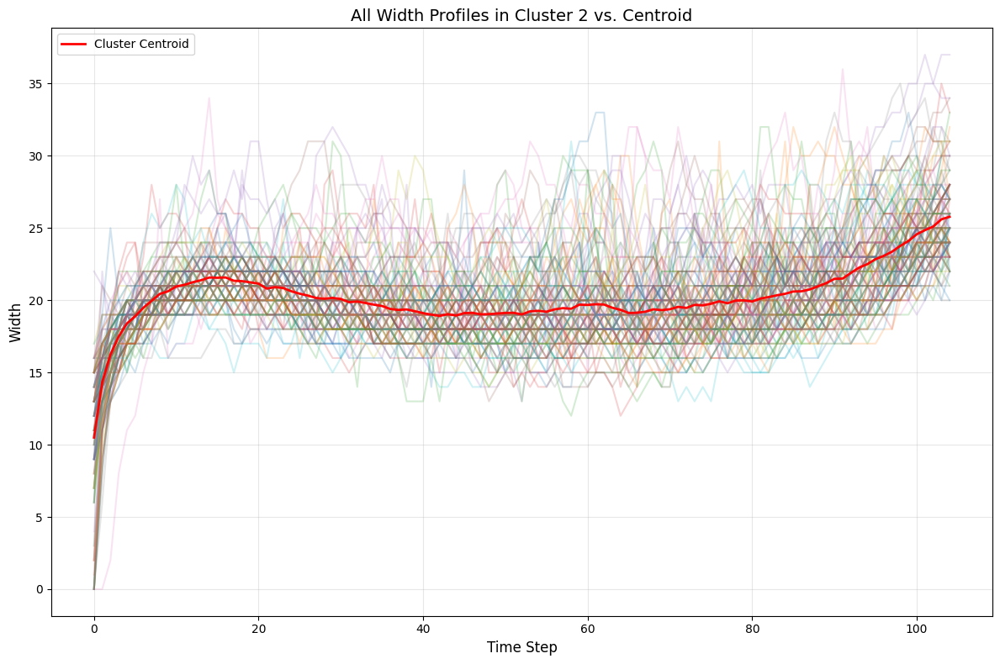

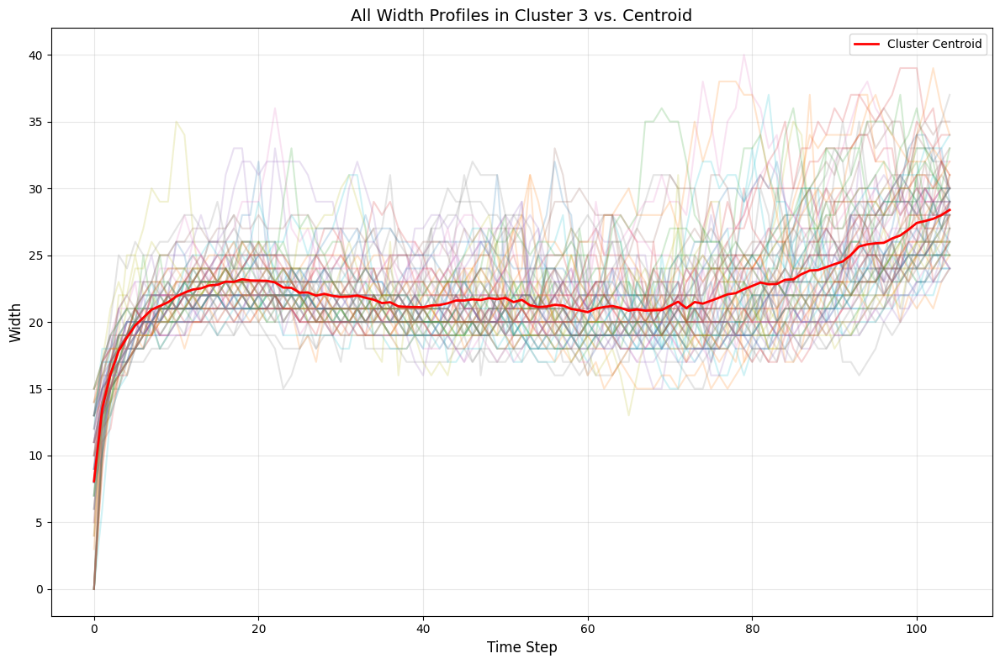

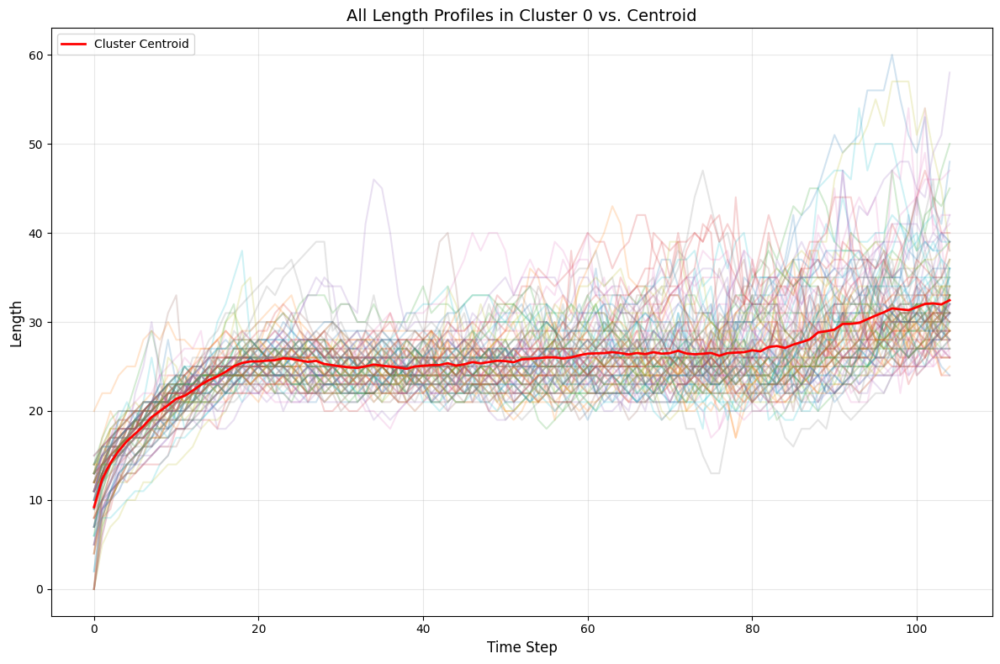

...

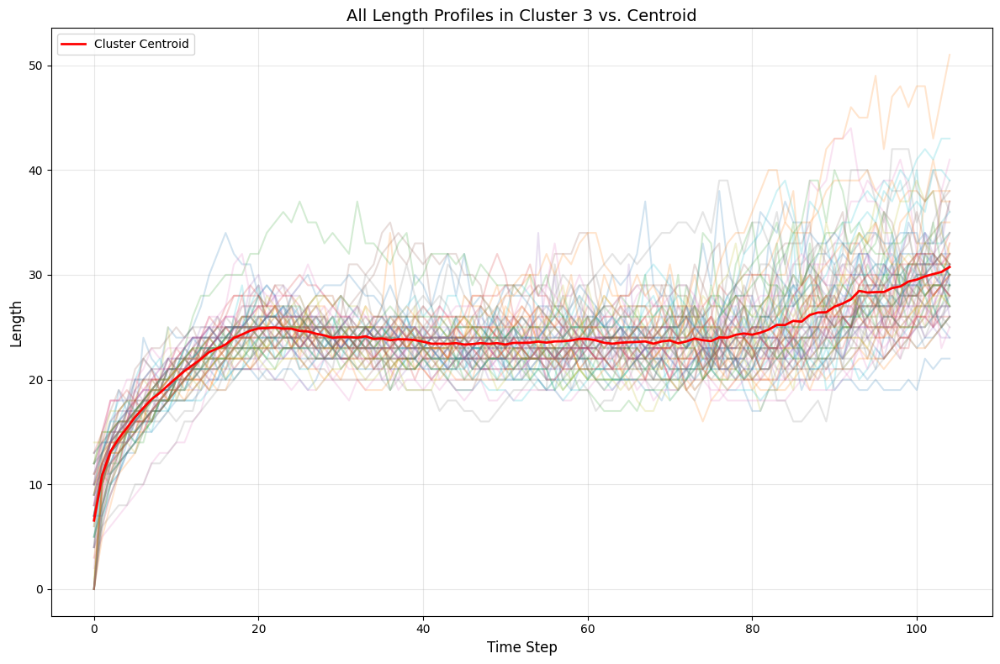

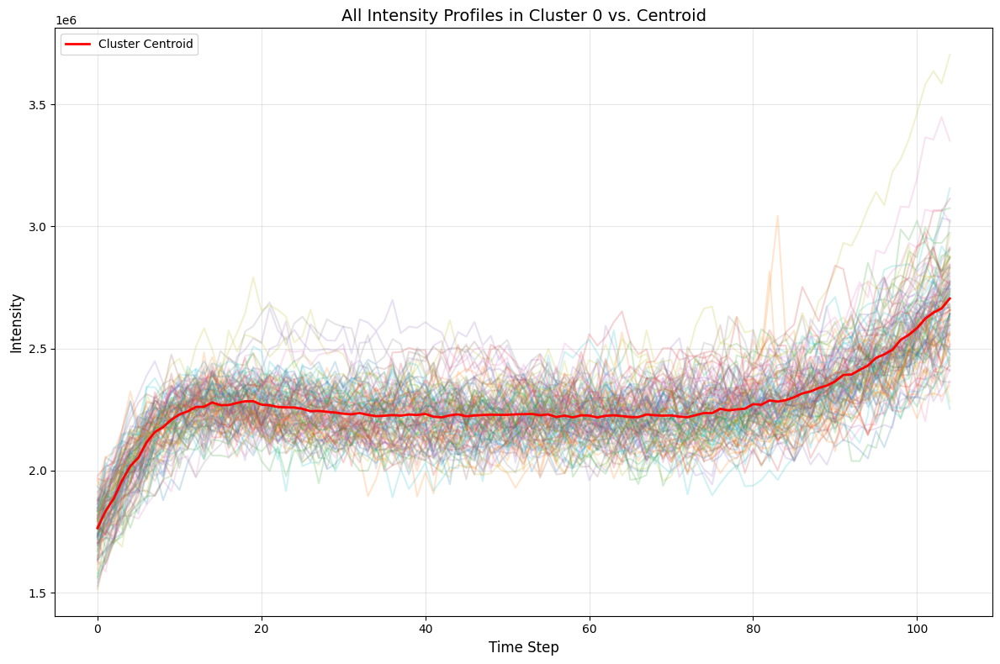

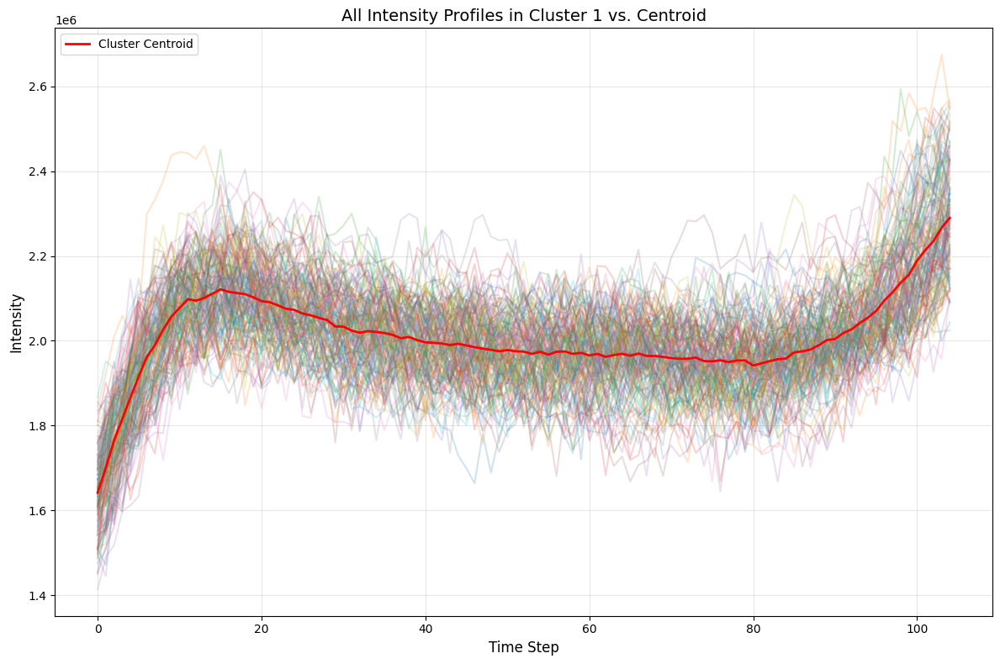

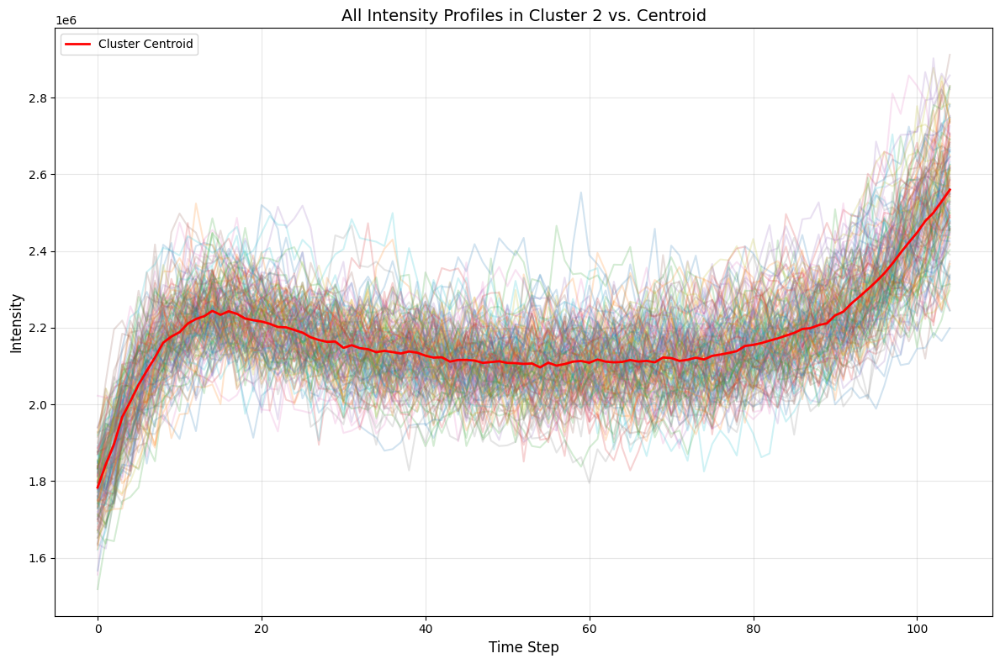

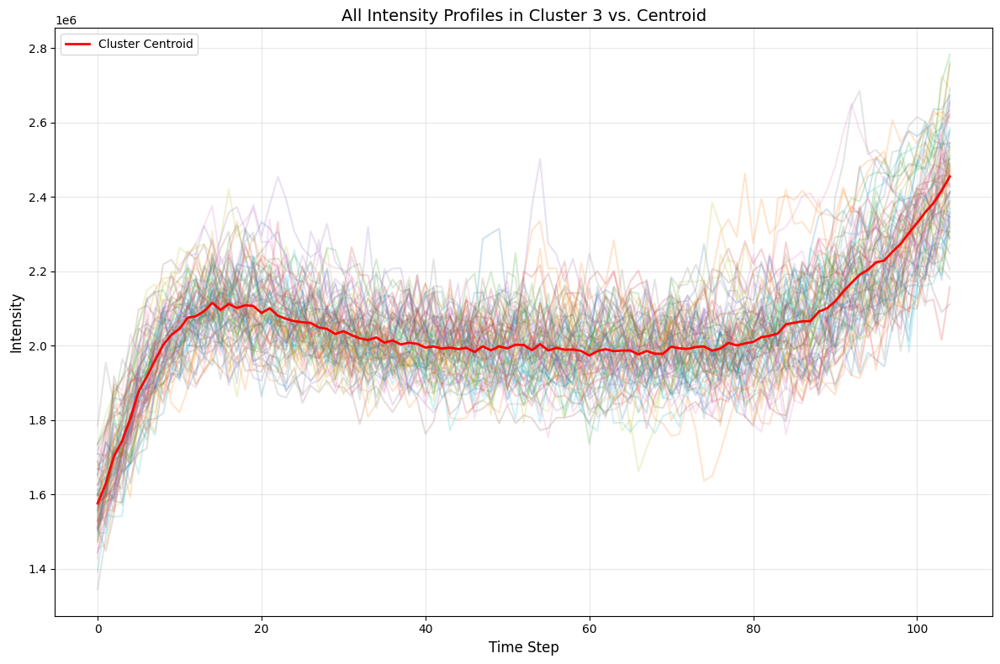

In [24]:
# Plot ALL profiles for each cluster and feature type
for feature_name, feature_data, centroids_orig in [
    ('Width', width_data, width_centroids_orig),
    ('Length', length_data, length_centroids_orig),
    ('Intensity', intensity_data, intensity_centroids_orig)
]:
    # Create x-axis values to ensure alignment
    x_values = np.arange(feature_data.shape[1])
    
    for cluster_id in range(optimal_k):
        # Create a new figure for each cluster
        plt.figure(figsize=(12, 8))

        # Get profiles for this cluster
        cluster_indices = np.where(cluster_labels == cluster_id)[0]
        cluster_data = feature_data.iloc[cluster_indices]

        # Plot individual profiles
        for i in range(cluster_data.shape[0]):
            plt.plot(x_values, cluster_data.iloc[i, :], alpha=0.2)

        # Plot the centroid
        plt.plot(x_values, centroids_orig[cluster_id], linewidth=2, color='red', label='Cluster Centroid')

        plt.xlabel('Time Step', fontsize=12)
        plt.ylabel(feature_name, fontsize=12)
        plt.title(f'All {feature_name} Profiles in Cluster {cluster_id} vs. Centroid', fontsize=14)
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

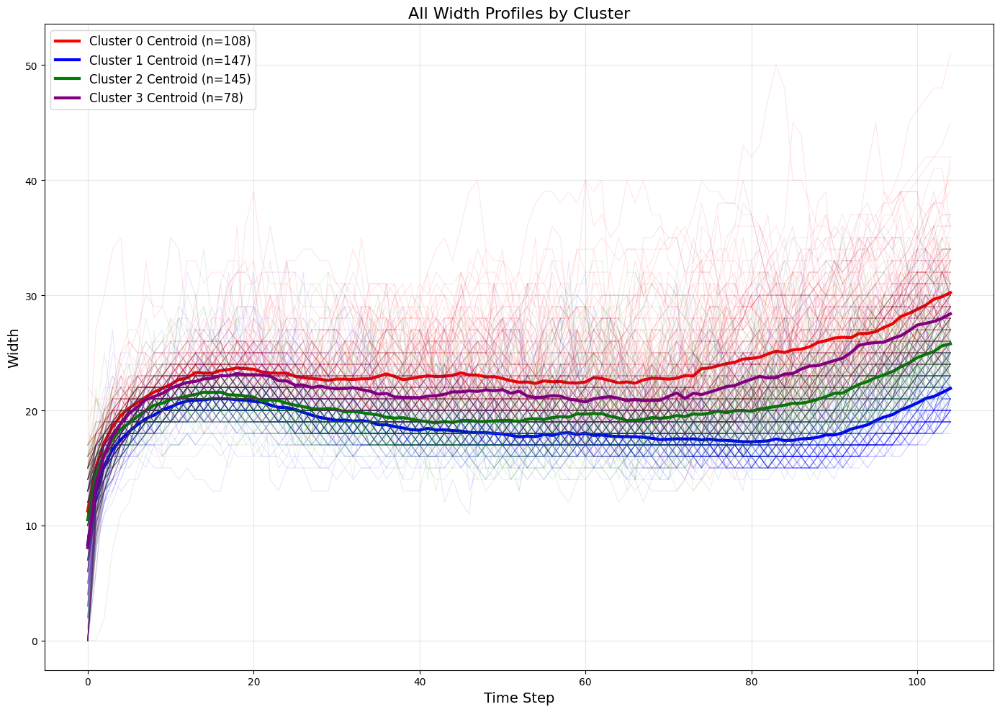

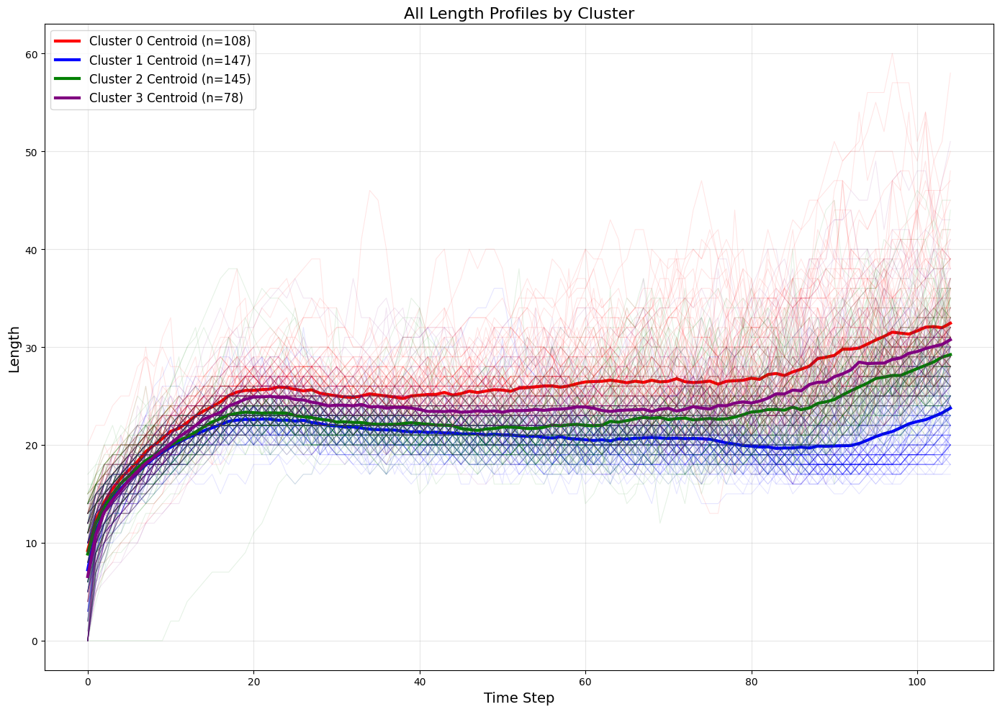

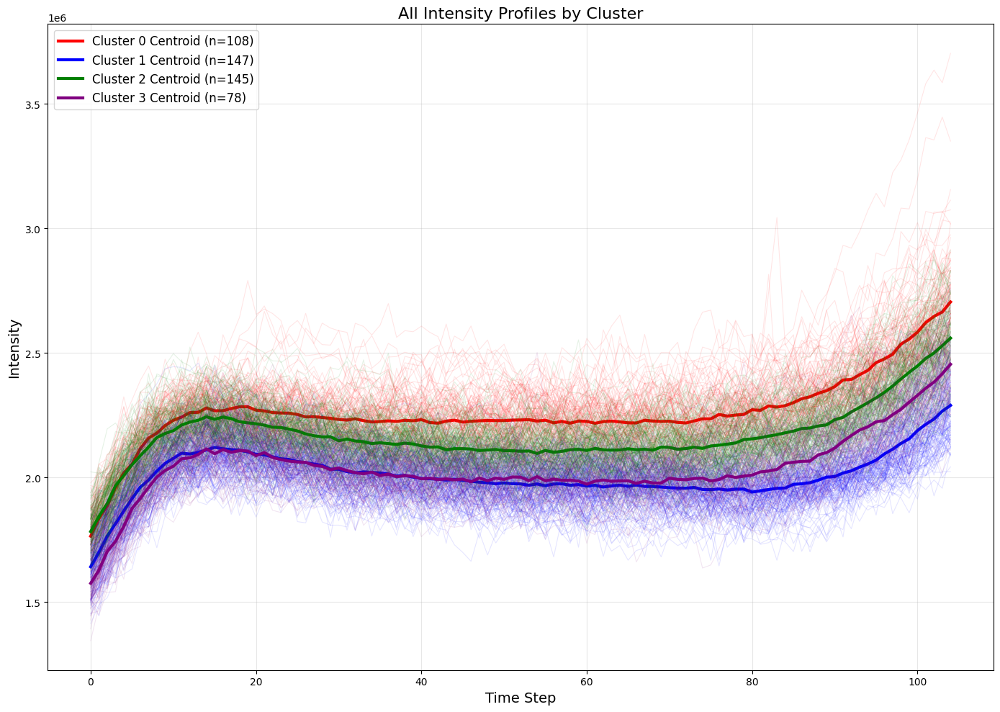

In [23]:
# Plot ALL profiles for each feature type in a single figure with proper alignment
for feature_name, feature_data, centroids_orig in [
    ('Width', width_data, width_centroids_orig),
    ('Length', length_data, length_centroids_orig),
    ('Intensity', intensity_data, intensity_centroids_orig)
]:
    # Create a single figure for each feature
    plt.figure(figsize=(14, 10))

    # Define colors for each cluster
    colors = ['red', 'blue', 'green', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan']

    # Create x-axis values to ensure alignment
    x_values = np.arange(feature_data.shape[1])

    # Plot profiles for each cluster
    for cluster_id in range(optimal_k):
        # Get profiles for this cluster
        cluster_indices = np.where(cluster_labels == cluster_id)[0]
        cluster_data = feature_data.iloc[cluster_indices]

        # Plot individual profiles with light color
        for i in range(cluster_data.shape[0]):
            plt.plot(x_values, cluster_data.iloc[i, :],
                     color=colors[cluster_id % len(colors)],
                     alpha=0.1,
                     linewidth=0.8)

        # Plot the centroid with solid color and thicker line
        # Ensure the centroid is the same length as the data
        if centroids_orig[cluster_id].shape[0] != x_values.shape[0]:
            print(f"Warning: Centroid length {centroids_orig[cluster_id].shape[0]} doesn't match data length {x_values.shape[0]}")
            # Trim or pad the centroid to match x_values
            centroid_to_plot = centroids_orig[cluster_id][:min(centroids_orig[cluster_id].shape[0], x_values.shape[0])]
            x_for_centroid = x_values[:len(centroid_to_plot)]
        else:
            centroid_to_plot = centroids_orig[cluster_id]
            x_for_centroid = x_values

        plt.plot(x_for_centroid, centroid_to_plot,
                 linewidth=3,
                 color=colors[cluster_id % len(colors)],
                 label=f'Cluster {cluster_id} Centroid (n={len(cluster_indices)})')

    plt.xlabel('Time Step', fontsize=14)
    plt.ylabel(feature_name, fontsize=14)
    plt.title(f'All {feature_name} Profiles by Cluster', fontsize=16)
    plt.legend(fontsize=12)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()